# Toolkit for Advanced Optimization (TAO)

The [*Toolkit for Advanced Optimization*](http://www.mcs.anl.gov/research/projects/tao/) (TAO) is aimed at the solution of large-scale optimization problems on high-performance architectures. Its main goals are portability, performance, scalable parallelism, and an interface independent of the architecture. TAO builds on the [*Portable, Extensible, Toolkit for Scientific Computation*](http://www.mcs.anl.gov/petsc/petsc-as). As of *PETSc* version 3.5, *TAO* is now included as part of the *PETSc* distribution. Both libraries are developed and maintained by [*Argonne National Labs*](http://www.anl.gov/), a science and engineering center located just outside of Chicago. 

We want to thank [Kenneth Judd](http://www.stanford.edu/~judd/) for pointing us towards the toolkit. [Stefan Wild](http://www.mcs.anl.gov/~wild/index.html) was kind enough to help us get started using it.

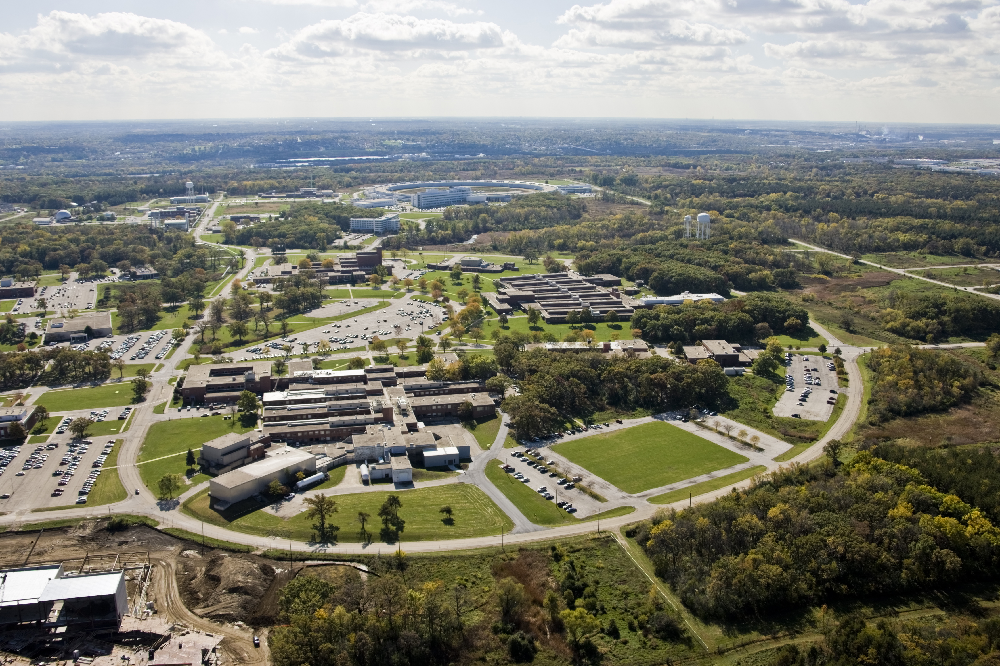

In [2]:
Image(filename='images/argonne.jpg')

It is managed by the [U.S. Department of Energy](http://www.energy.gov) and the University of Chicago's [Computation Institute](https://www.ci.uchicago.edu). It his home to the *Mira* supercomputer, which is the $5^{th}$ most powerful supercomputer in the world according top the [Top500](http://www.top500.org/list/2014/11/) list.

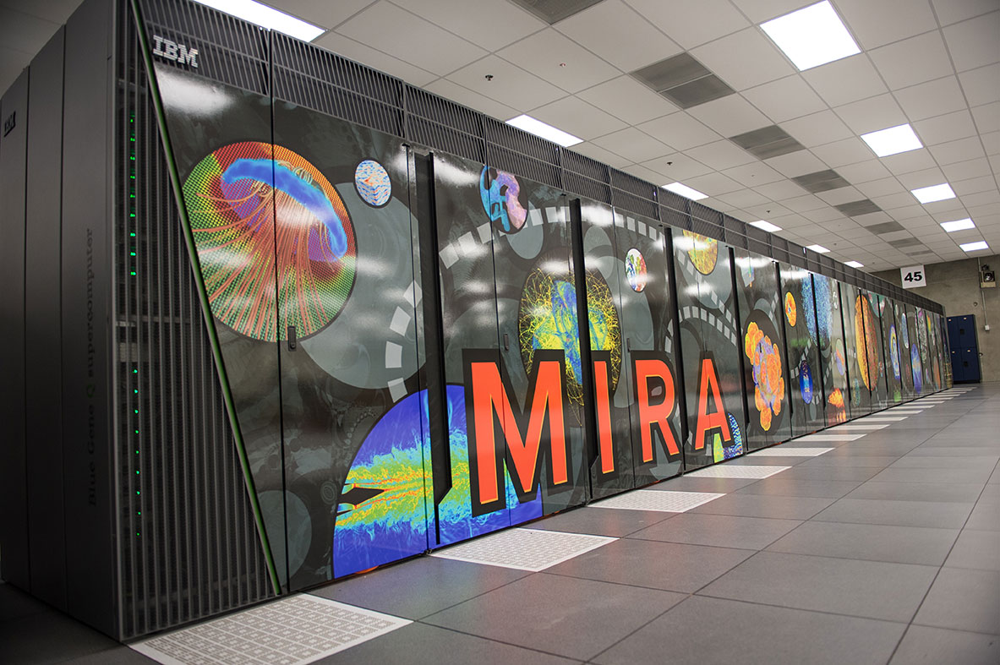

In [3]:
Image(filename='images/mira.jpg')

*TAO* includes a variety of optimization algorithms for several classes of problems:

#### Unconstraint Minimization

* Function Evaluations
    * Nelder-Mead

* Function and Gradient Evaluation
    * Limited-Memory, Variable-Metric Method
    * Nonlinear Conjugate Gradient Method

* Function, Gradient, and Hessian Evaluation
    * Newton Line Search Method
    * Newton Trust-Region Method

#### Nonlinear Least-Squares

* Function Evaluations
    * POUNDerS
    
In addition, several algorithms for *Bound-Constraint Optimization* and *PDE Constraint Optimization*. Details about these solvers are available in the [*TAO User Manual*](http://www.mcs.anl.gov/research/projects/tao/docs/tao_manual.pdf). 

### *Python* 

Thanks to the work by [Lisandro Dalcin](https://github.com/dalcinl) *Python* bindings for both libraries exist.

* [petsc4py](https://code.google.com/p/petsc4py/)
* [tao4py](https://code.google.com/p/tao4py/)

Full installation of these tools is a bit tedious due to compatibility issues with different versions of all the libraries. I ended up using the following specifications:
* *PETSc-3.4.5* with *petc4py-3.4*
* *TAO-2.2* with *tao4py-2.2*

## Illustration

I will build on the examples provided as part on the *tao4py* package in the *demo* subdirectory. Before we get started, we need to import some basic packages.

All required files are available on [*GitHub*](https://github.com/softEcon/course/tree/master/special_topics/toolkit_for_advanced_optimization/modules).

In [4]:
%%capture
# TAO for Python. This sets the 
# internal solver to GQT instead
# of TRON.
import tao4py

tao4py.init(['-tao_pounders_gqt'])

from tao4py import TAO

# PETSC for Python
from petsc4py import PETSc

# Notebook Displays
from IPython.display import display, HTML, Image

# Time Access and Conversions
import time

# Scientific Computing
import numpy as np

# Plotting 
import matplotlib.pyplot as plt
%pylab inline --no-import-all

# System-specific Parameters and Functions
import sys

# Importing the module wrapping
# the criterion functions and
# the functions for the visual
# illustration. We also import
# auxiliary functions.
sys.path.insert(0, 'modules')
from clsOpt import OptCls
from graphs import *
from auxiliary import *

We will compare the performance of the *Nelder-Mead* and *POUNDerS* algorithm for a Nonlinear-Least Squares Problem of the following form:

\begin{align}
f(\beta) = \sum^{N}_{i=1} F_i(\beta)^2,
\end{align}

where 

\begin{align}
F_i(\beta) = y_i - \left(\frac{\exp\{-\beta_0 x_i\}}{\beta_1 + \beta_2 x_i}\right).
\end{align}

Both algorithms are derivative-free but differ in their search strategy and how they exploit the structure of the criterion function. Nelder–Mead applies a direct search method, whereas *POUNDerS* forms an approximation model within a trust region, which exploits the special structure of our nonlinear least-squares problem. See Munson & al. (2012) for a detailed description of the underlying mechanics of *POUNDerS*.

I set up a *TAO* interface in the file [*clsOpt.py*](https://github.com/softEcon/course/blob/master/lectures/special_topics/toolkit_for_advanced_optimization/modules/clsOpt.py) module. I hope it provides you with a useful starting point for your own optimization problems. 

Let us look at the overall structure of the class.

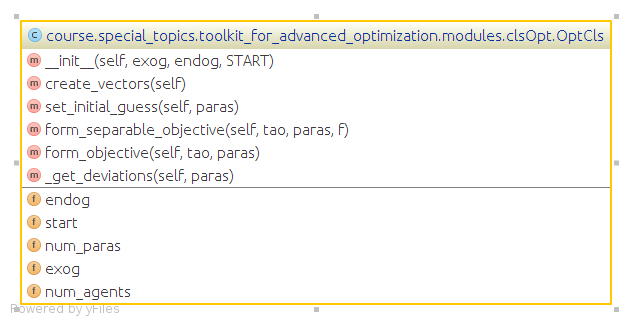

In [12]:
Image(filename='images/clsOpt.png')

Now we can turn to the details.

In [13]:
display(HTML('images/clsOpt.py.html')) 

clsOpt.py


Here is an example to use the *POUNDerS* algorithm.

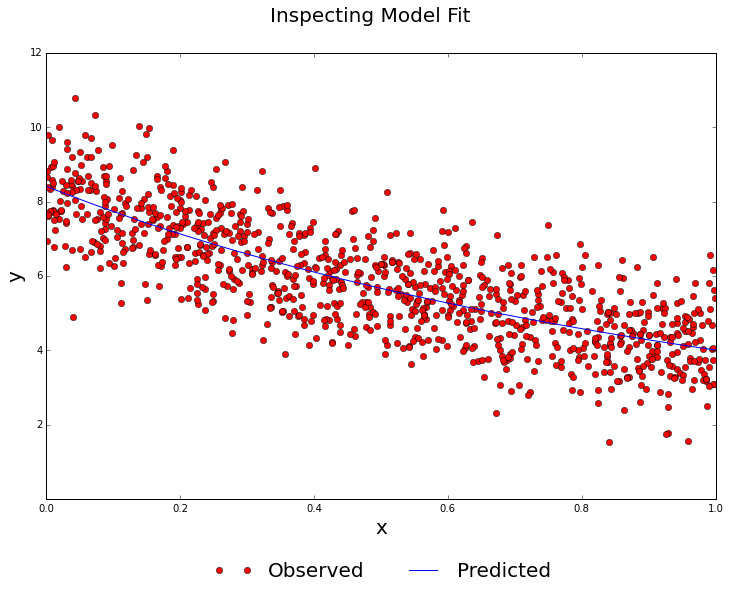

In [7]:
# Ensure recomputability
np.random.seed(456)

# Parameterization of optimization 
# problem
PARAS = [0.20, 0.12, 0.08]   # True values
START = [0.10, 0.08, 0.05]   # Starting values

num_agents = 1000

# Simulate a sample
exog, endog = simulate_sample(num_agents, PARAS)

# Initialize class container
opt_obj = OptCls(exog, endog, START)

# Manage PETSc objects.
paras, crit = opt_obj.create_vectors()

opt_obj.set_initial_guess(paras)

# Initialize solver instance
tao = TAO.Solver().create(PETSc.COMM_SELF)

tao.setType('tao_pounders')

tao.setFromOptions()

tao.setSeparableObjective(opt_obj.form_separable_objective, crit)

# Solve optimization problem
tao.solve(paras)

# Inspect solution
plot_solution(paras, endog, exog)

# Cleanup
paras.destroy()

crit.destroy()

tao.destroy()

Let us now compare the performance of the *Nelder-Mead* and *POUNDerS* algorithm on the same simulated dataset as we increase the number of data points.

In [8]:
# Ensure recomputability
np.random.seed(456)

# parameterization
PARAS = [0.20, 0.12, 0.08]   # True values
START = [0.10, 0.08, 0.05]   # Starting values

# Initialize agent grid
agent_grid = range(1000, 10000, 500)

# Initialize container for result 
rslt = dict()

for algorithm in ['tao_pounders', 'tao_nm']:
    rslt[algorithm] = dict()
    for key_ in ['time', 'rmse']:
        rslt[algorithm][key_] = []

# Iterate over optimization tasks 
for num_agents in agent_grid:
    
    # Simulate a sample
    exog, endog = simulate_sample(num_agents, PARAS)
    
    for algorithm in ['tao_pounders', 'tao_nm']:
        
        for _ in range(3):
 
            # Initialize class container
            opt_obj = OptCls(exog, endog, START)

            # Manage PETSc objects.
            paras, crit = opt_obj.create_vectors()

            # Initialize solver instance
            tao = TAO.Solver().create(PETSc.COMM_SELF)

            tao.setType(algorithm)

            tao.setFromOptions()

            # Attach objective function
            if algorithm == 'tao_pounders':
                tao.setSeparableObjective(opt_obj.form_separable_objective, crit)
            else:
                tao.setObjective(opt_obj.form_objective)

            # Average time across several optimization
            # tasks to determine computing time. 
            total_times, rmse_list = [], []
       
            # Set starting values
            opt_obj.set_initial_guess(paras)

            # Measure execution time of for estimation
            start_time = time.time()

            tao.solve(paras)

            exit_time = time.time()
            
            # Collect information, The rmse is constant
            # across the iterations.
            total_times += [exit_time - start_time]
            
            rmse_list += [np.sqrt(np.mean((PARAS - paras[:])**2))]

            # Cleanup
            paras.destroy()

            crit.destroy()

            tao.destroy()

        # Collect performance measures
        rslt[algorithm]['time'] += [np.mean(total_times)]

        rslt[algorithm]['rmse'] += [np.mean(rmse_list)]


Let us visualize the results. We start with the execution time and look at the root-mean squared error.

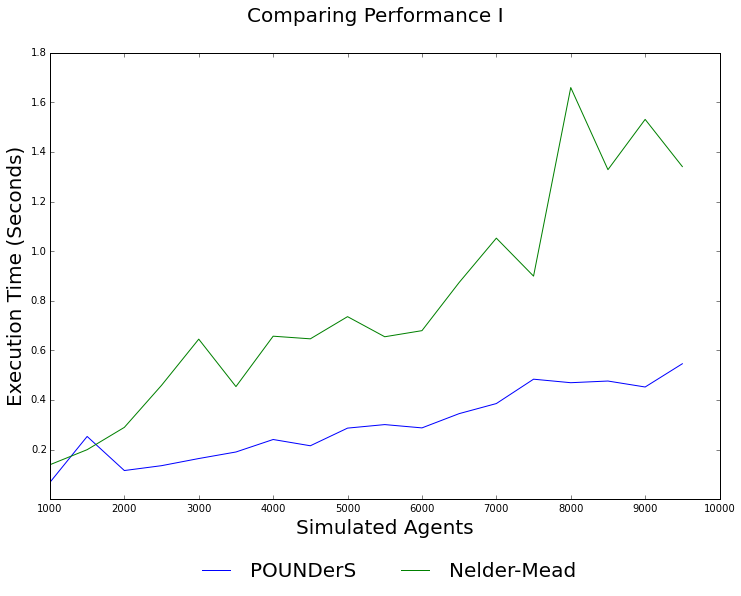

In [9]:
# The function is available in the 
# subdirectory modules/graphs.py
plot_performance_time(rslt, agent_grid)

Further inspection shows that the number of evaluations of the criterion functions remains roughly constant for both optimizers as we increase the number of agents. However, the number of function evaluations is much smaller for the *POUNDerS* algorithm. The evaluatios get more and more costly as we increase the number of agents. 

Are there any differences in the quality of our results?

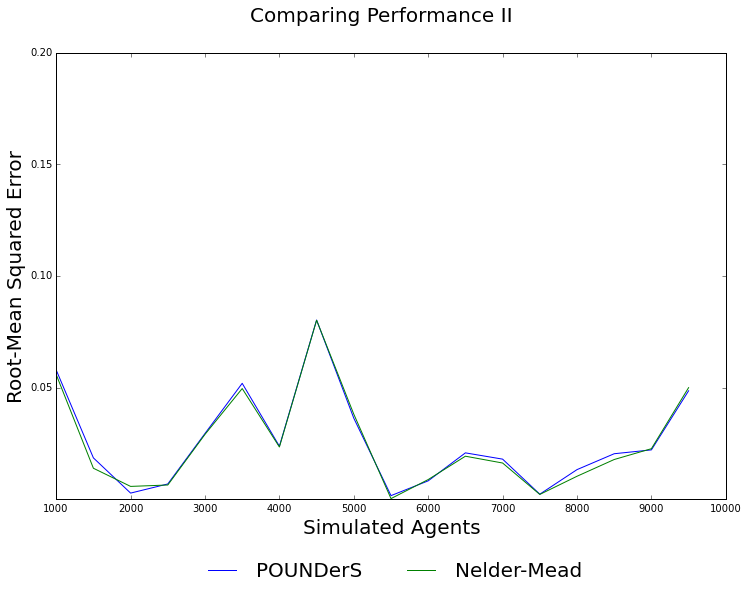

In [10]:
# The function is available in the 
# subdirectory modules/graphs.py
plot_performance_rmse(rslt, agent_grid)

## Research Example

In Eisenhauer & al. (2015), we estimate a simplified model of educational choices using the *Simulated Method of Moments*. We provide a similar comparison between the *POUNDerS* and *Nelder-Mead* algorithm. 

We perturb our estimated parameter values and start both algorithms using their default options and monitor the relative performance over time. We show a minute-by-minute account of the criterion function $\lambda(\psi)$ over five hours.
The POUNDerS algorithm attains a lower bound of $\lambda(\psi) \approx 385$ after about two and a half hours and terminates. With the Nelder–Mead algorithm, the criterion function still takes a value of $\lambda(\psi) \approx 2,050$ after five hours. Even after 36 hours, the Nelder–Mead solution $\lambda(\psi) \approx 1,126$ is still about three times as large as the *POUNDerS* solution. This stylized presentation lines up with our experience throughout the whole project.

However, in contrast to the illustration earlier, the quality of the final results is much higher when relying on the *POUNDerS* algorithm.

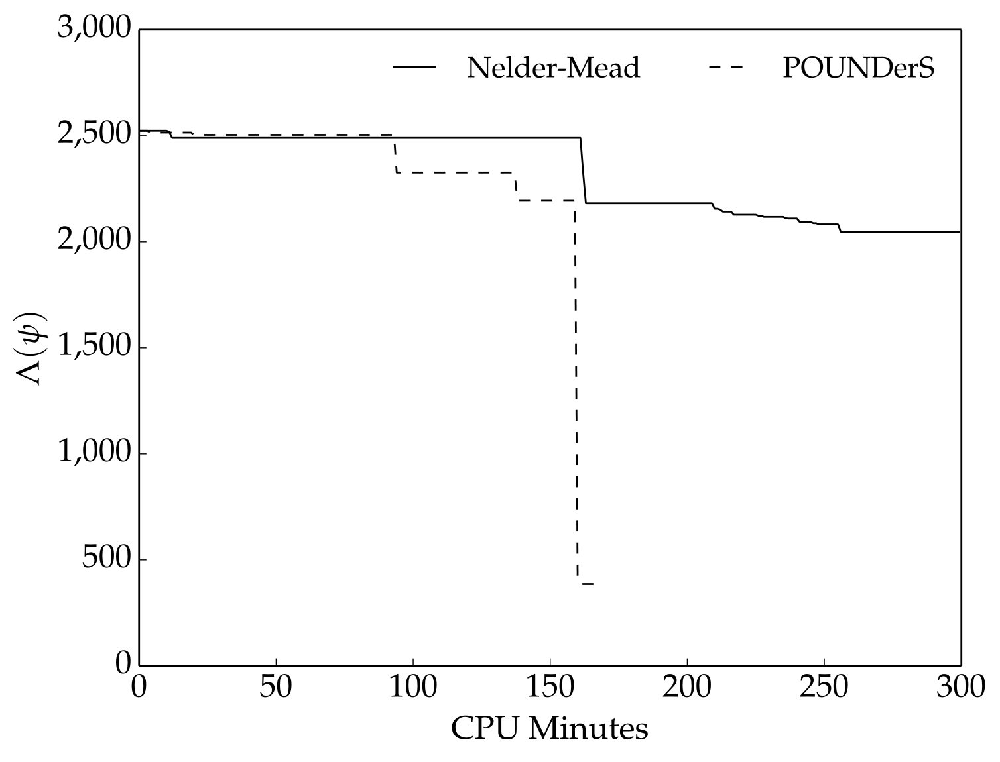

In [11]:
Image(filename='images/benchmarking.png')

## Summary

The choice of an appropriate optimization algorithm can have a tremendously positive effect on the execution time without any detrimental effect on the quality of the solution. Combining the application of fast state-of-the-art optimization algorithms with parallel computing allows for a thorough analysis even in computation-intensive models.

## Further Information

The main goal of this lecture was to create awareness that the choice of the optimization algorithm can be crucial. *TAO* turned out to be very useful in my own research, but a variety of other optimization libraries exist as well.

* [NLopt](http://ab-initio.mit.edu/wiki/index.php/NLopt)
* [DAKOTA](https://software.sandia.gov/trac/dakota/wiki)
* [Ipopt](https://projects.coin-or.org/Ipopt)
* [OpenOpt](http://www.openopt.org/)


Here is a list of books that helped me learn more about numerical optimization. 

* Kenneth Judd (1998). *Numerical Methods in Economics*. MIT Press, Cambridge, MA.

* Andrew Conn, Katya Scheinberg, Luis Vicente. *Introduction to Derivative-Free Optimization*. Society for Industrial and Applied Mathematics, Philadelphia, PA.

* Jorge Nocedal, Stephen Wright (2006). *Numerical Optimization*. Springer, New York, NY.

The papers below provide informative benchmarking excercises of derivative-free optimization algorithms:

* Jose More, Stefan Wild (2009). *Benchmarking Derivative-Free Optimization Algorithms*. SIAM Journal of Optimization, 20:172–91.

* Luis Miguel Rios, Nikolaos V. Sahinidis (2013). *Derivative-free Optimization: A Review of Algorithms and Comparison of Software Implementations*. Journal of Global Optimization. 56(3):1247-1293.

## References

Philipp Eisenhauer, James J. Heckman, Stefano Mosso (2015). *Estimation of Dynamic Discrete Choice Models by Maximum Likelihood and Simulated Methods of Moments*. International Economic Review, 56(2): 331-357.

Todd Munson, Jason Sarich, Stefan Wild, Steven Benson, Lois Curfman McInnes (2012). *TAO 2.0 Users Manual*. Mathematics and Computer Science Division, Argonne  National Laboratory.

## Contributor

This lecture was prepared and is maintained by [Philipp Eisenhauer](http://www.policy-lab.org/peisenha/). He is an economist at the [University of Bonn](www.uni-bonn.de) working on uncertainty in dynamic economic models. He welcomes comments and suggestions for improvements at [eisenhauer@policy-lab.org]().

***Formatting***

In [3]:
import urllib; from IPython.core.display import HTML
HTML(urllib.urlopen('http://bit.ly/1K5apRH').read())